In [149]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [150]:
df = pd.read_csv('/content/drive/MyDrive/OnlineRetail.csv', encoding = 'latin-1', na_values='?')

In [151]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [152]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540408 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [153]:
df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1501
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [154]:
df.dropna(inplace = True)
df.reset_index(inplace = True)
df.drop(columns = ['index'], inplace = True)

In [155]:
df['CustomerID'].nunique()

4372

In [156]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,406829.000000,406829.000000,406829.000000
mean,12.061303,3.460471,15287.690570
std,248.693370,69.315162,1713.600303
min,-80995.000000,0.000000,12346.000000
25%,2.000000,1.250000,13953.000000
50%,5.000000,1.950000,15152.000000
75%,12.000000,3.750000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [157]:
df['total_price'] = df['Quantity'] * df['UnitPrice']
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


In [158]:
print('total number of invoice by country\n')
df.groupby('Country')['InvoiceNo'].count().sort_values(ascending = False)

total number of invoice by country



Country
United Kingdom          361878
Germany                   9495
France                    8491
EIRE                      7485
Spain                     2533
Netherlands               2371
Belgium                   2069
Switzerland               1877
Portugal                  1480
Australia                 1259
Norway                    1086
Italy                      803
Channel Islands            758
Finland                    695
Cyprus                     622
Sweden                     462
Austria                    401
Denmark                    389
Japan                      358
Poland                     341
USA                        291
Israel                     250
Unspecified                244
Singapore                  229
Iceland                    182
Canada                     151
Greece                     146
Malta                      127
United Arab Emirates        68
European Community          61
RSA                         58
Lebanon                     45


In [159]:
df['Country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Greece', 'Singapore', 'Lebanon',
       'United Arab Emirates', 'Saudi Arabia', 'Czech Republic', 'Canada',
       'Unspecified', 'Brazil', 'USA', 'European Community', 'Bahrain',
       'Malta', 'RSA'], dtype=object)

In [160]:
fig = px.histogram(df,
             x = 'Country',
             title = 'No. of invoices by country',
             color = 'Country')
fig.show()

In [161]:
fig = px.histogram(df,
                   x = df.groupby('Country')['InvoiceNo'].nunique().index,
                   y = df.groupby('Country')['InvoiceNo'].nunique().values,
                   title = 'The unique number invoices from different countries')

fig.show()

In [162]:
print('Top 5 countries by total price\n')

df.groupby(['InvoiceNo','CustomerID','Country','UnitPrice','Quantity'])['total_price'].sum().sort_values(ascending = False).head()

Top 5 countries by total price



InvoiceNo  CustomerID  Country         UnitPrice  Quantity
581483     16446.0     United Kingdom  2.08       80995       168469.6
541431     12346.0     United Kingdom  1.04       74215        77183.6
556444     15098.0     United Kingdom  649.50     60           38970.0
572209     18102.0     United Kingdom  10.95      300          19710.0
556255     18102.0     United Kingdom  4.58       300          16488.0
Name: total_price, dtype: float64

In [163]:
print('Top 5 countries by total price\n')

df.groupby(['InvoiceNo','CustomerID','Country','UnitPrice','Quantity'])['total_price'].sum().sort_values().head()

Top 5 countries by total price



InvoiceNo  CustomerID  Country         UnitPrice  Quantity
C581484    16446.0     United Kingdom  2.08       -80995     -168469.60
C541433    12346.0     United Kingdom  1.04       -74215      -77183.60
C556445    15098.0     United Kingdom  38970.00   -1          -38970.00
C573079    12536.0     France          4161.06    -2           -8322.12
C551685    16029.0     United Kingdom  8142.75    -1           -8142.75
Name: total_price, dtype: float64

In [164]:
print('Top 5 countries by total Qunatity\n')

df.groupby(['InvoiceNo','CustomerID','Country'])['Quantity'].sum().sort_values(ascending = False).head()

Top 5 countries by total Qunatity



InvoiceNo  CustomerID  Country       
581483     16446.0     United Kingdom    80995
541431     12346.0     United Kingdom    74215
556917     12415.0     Australia         15049
563076     14646.0     Netherlands       14730
572035     14646.0     Netherlands       13392
Name: Quantity, dtype: int64

In [165]:
print('InvoiceNo starts with A:')

df['InvoiceNo'].str.startswith('A').value_counts()

InvoiceNo starts with A:


False    406829
Name: InvoiceNo, dtype: int64

In [166]:
print('InvoiceNo starts with C:')

df['InvoiceNo'].str.startswith('C').value_counts()

InvoiceNo starts with C:


False    397924
True       8905
Name: InvoiceNo, dtype: int64

In [167]:
print('Combing both InvoiceNo starts with A and C:')

(df['InvoiceNo'].str.startswith('C') | df['InvoiceNo'].str.startswith('A')).value_counts()

Combing both InvoiceNo starts with A and C:


False    397924
True       8905
Name: InvoiceNo, dtype: int64

In [168]:
# the invoice No that starts with A & C are basically canclled orders

In [169]:
CA_values = (df['InvoiceNo'].str.startswith('A') | df['InvoiceNo'].str.startswith('C')).value_counts()
CA_values = pd.DataFrame(CA_values)

In [170]:
CA_values

,InvoiceNo
False,397924
True,8905


In [171]:
CA_values.rename(index = {False: 'Invoice without C & A values', True: 'Invoice with C & A values'}, inplace = True)
CA_values

,InvoiceNo
Invoice without C & A values,397924
Invoice with C & A values,8905


In [172]:
fig = px.pie(CA_values,
             values = 'InvoiceNo',
             names = CA_values.index,
             title = 'Percentage of values that have C & A values')

fig.show()

In [173]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


In [174]:
df['Quantity'].sort_values(ascending = False)

406349    80995
38120     74215
378894    12540
315541     4800
146796     4300
          ...  
112371    -2000
112372    -3114
3102      -9360
38125    -74215
406350   -80995
Name: Quantity, Length: 406829, dtype: int64

In [175]:
# as we can see that there are negative values in the quantis feature

In [176]:
(df['Quantity'] < 0).value_counts()

False    397924
True       8905
Name: Quantity, dtype: int64

In [177]:
quantity_values = (df['Quantity'] < 0).value_counts()
quantity_values = pd.DataFrame(quantity_values)
quantity_values

,Quantity
False,397924
True,8905


In [178]:
quantity_values.rename(index = {False: 'quantity values that has values more than 0', True: 'Quantity values that has values more than 0'},inplace = True)
quantity_values

,Quantity
quantity values that has values more than 0,397924
Quantity values that has values more than 0,8905


In [179]:
fig = px.pie(quantity_values,
             values = 'Quantity',
             names = quantity_values.index,
             title = 'Quantity values that has negative and positive values')

fig.show()

In [180]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


In [181]:
(df['UnitPrice'] < 0).value_counts()

False    406829
Name: UnitPrice, dtype: int64

In [182]:
# here we can see that there are no negative values

In [183]:
print('Top countries by orders')

df.groupby(['CustomerID','Country'])['InvoiceNo'].count().sort_values(ascending = False)

Top countries by orders


CustomerID  Country       
17841.0     United Kingdom    7983
14911.0     EIRE              5903
14096.0     United Kingdom    5128
12748.0     United Kingdom    4642
14606.0     United Kingdom    2782
                              ... 
14351.0     United Kingdom       1
15562.0     United Kingdom       1
17065.0     United Kingdom       1
15070.0     United Kingdom       1
14090.0     United Kingdom       1
Name: InvoiceNo, Length: 4380, dtype: int64

In [184]:
# here we can see that by total number order UK comes at the top

In [185]:
print('Top countries with lowest no. of orders')

df.groupby(['CustomerID','Country'])['InvoiceNo'].count().sort_values().head()

Top countries with lowest no. of orders


CustomerID  Country       
16579.0     United Kingdom    1
12505.0     Italy             1
13366.0     United Kingdom    1
12503.0     Spain             1
15562.0     United Kingdom    1
Name: InvoiceNo, dtype: int64

In [186]:
print('Top countries with highest number orders by quantities:')

df.groupby(['CustomerID','Country'])['Quantity'].sum().sort_values(ascending = False).head()

Top countries with highest number orders by quantities:


CustomerID  Country       
14646.0     Netherlands       196719
12415.0     Australia          77242
14911.0     EIRE               77180
17450.0     United Kingdom     69029
18102.0     United Kingdom     64122
Name: Quantity, dtype: int64

In [187]:
print('Top countries with lowest number orders by quantities:')

df.groupby(['CustomerID','Country'])['Quantity'].sum().sort_values().head()

Top countries with lowest number orders by quantities:


CustomerID  Country       
16546.0     United Kingdom   -303
15823.0     United Kingdom   -283
14213.0     United Kingdom   -244
16742.0     United Kingdom   -189
16252.0     United Kingdom   -158
Name: Quantity, dtype: int64

In [188]:
print('Top countries with highest total purchase:')

df.groupby(['CustomerID','Country'])['total_price'].sum().sort_values(ascending = False).head()

Top countries with highest total purchase:


CustomerID  Country       
14646.0     Netherlands       279489.02
18102.0     United Kingdom    256438.49
17450.0     United Kingdom    187482.17
14911.0     EIRE              132572.62
12415.0     Australia         123725.45
Name: total_price, dtype: float64

In [189]:
print('Top countries with lowest total purchase:')

df.groupby(['CustomerID','Country'])['total_price'].sum().sort_values().head()

Top countries with lowest total purchase:


CustomerID  Country       
17448.0     United Kingdom   -4287.63
15369.0     United Kingdom   -1592.49
14213.0     United Kingdom   -1192.20
17603.0     United Kingdom   -1165.30
12503.0     Spain            -1126.00
Name: total_price, dtype: float64

In [190]:
df.groupby('Country')["CustomerID"].nunique().sort_values(ascending=False)

Country
United Kingdom          3950
Germany                   95
France                    87
Spain                     31
Belgium                   25
Switzerland               21
Portugal                  19
Italy                     15
Finland                   12
Austria                   11
Norway                    10
Netherlands                9
Australia                  9
Denmark                    9
Channel Islands            9
Cyprus                     8
Sweden                     8
Japan                      8
Poland                     6
USA                        4
Canada                     4
Unspecified                4
Israel                     4
Greece                     4
EIRE                       3
Malta                      2
United Arab Emirates       2
Bahrain                    2
Czech Republic             1
Lithuania                  1
Lebanon                    1
RSA                        1
Saudi Arabia               1
Singapore                  1
Icelan

In [191]:
## we will see the cancelled orders

In [192]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


In [193]:
df[df['InvoiceNo'].str.startswith('C')]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
141,C536379,D,Discount,-1,12/1/2010 9:41,27.50,14527.0,United Kingdom,-27.50
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/2010 9:49,4.65,15311.0,United Kingdom,-4.65
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom,-19.80
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom,-6.96
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom,-6.96
...,...,...,...,...,...,...,...,...,...
406377,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,12/9/2011 9:57,0.83,14397.0,United Kingdom,-9.13
406461,C581499,M,Manual,-1,12/9/2011 10:28,224.69,15498.0,United Kingdom,-224.69
406635,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,12/9/2011 11:57,10.95,15311.0,United Kingdom,-54.75
406636,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,12/9/2011 11:58,1.25,17315.0,United Kingdom,-1.25


In [194]:
df[df['InvoiceNo'].str.startswith('C')].describe().T

,count,mean,std,min,25%,50%,75%,max
Quantity,8905.0,-30.859966,1170.154939,-80995.00,-6.00,-2.00,-1.00,-1.00
UnitPrice,8905.0,18.845519,444.366043,0.01,1.45,2.95,4.95,38970.00
CustomerID,8905.0,14991.667266,1706.772357,12346.00,13510.00,14895.00,16393.00,18282.00
total_price,8905.0,-68.651554,2019.177682,-168469.60,-17.00,-8.50,-3.30,-0.12


In [195]:
print('Cancelled order:\n')

df[df['Quantity'] < 0]

Cancelled order:



,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
141,C536379,D,Discount,-1,12/1/2010 9:41,27.50,14527.0,United Kingdom,-27.50
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/2010 9:49,4.65,15311.0,United Kingdom,-4.65
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom,-19.80
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom,-6.96
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom,-6.96
...,...,...,...,...,...,...,...,...,...
406377,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,12/9/2011 9:57,0.83,14397.0,United Kingdom,-9.13
406461,C581499,M,Manual,-1,12/9/2011 10:28,224.69,15498.0,United Kingdom,-224.69
406635,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,12/9/2011 11:57,10.95,15311.0,United Kingdom,-54.75
406636,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,12/9/2011 11:58,1.25,17315.0,United Kingdom,-1.25


In [196]:
cancelled_order = (df['InvoiceNo'].str.startswith('C').value_counts())

In [197]:
cancelled_order = pd.DataFrame(cancelled_order)
cancelled_order

,InvoiceNo
False,397924
True,8905


In [198]:
cancelled_order.rename(index = {False: 'The order which was not cancelled', True: 'The order which was cancelled'}, inplace = True)
cancelled_order

,InvoiceNo
The order which was not cancelled,397924
The order which was cancelled,8905


In [199]:
fig = px.pie(cancelled_order,
             values = cancelled_order['InvoiceNo'],
             names = cancelled_order.index,
             title = 'Total customer that has cancelled the order')

fig.show()

In [200]:
# total number of unique order ordered by per customer

In [201]:
df.groupby('CustomerID')['InvoiceNo'].nunique().sort_values(ascending = False)

CustomerID
14911.0    248
12748.0    224
17841.0    169
14606.0    128
13089.0    118
          ... 
13877.0      1
16400.0      1
13878.0      1
13886.0      1
13670.0      1
Name: InvoiceNo, Length: 4372, dtype: int64

In [202]:
# total number of toal order ordered by per customer

In [203]:
df.groupby('CustomerID')['InvoiceNo'].count().sort_values(ascending = False)

CustomerID
17841.0    7983
14911.0    5903
14096.0    5128
12748.0    4642
14606.0    2782
           ... 
14119.0       1
13747.0       1
15590.0       1
15562.0       1
17925.0       1
Name: InvoiceNo, Length: 4372, dtype: int64

In [204]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


In [205]:
df['Description'].value_counts()

WHITE HANGING HEART T-LIGHT HOLDER    2070
REGENCY CAKESTAND 3 TIER              1905
JUMBO BAG RED RETROSPOT               1662
ASSORTED COLOUR BIRD ORNAMENT         1418
PARTY BUNTING                         1416
                                      ... 
ANTIQUE RASPBERRY FLOWER EARRINGS        1
WALL ART,ONLY ONE PERSON                 1
GOLD/AMBER DROP EARRINGS W LEAF          1
INCENSE BAZAAR PEACH                     1
PINK BAROQUE FLOCK CANDLE HOLDER         1
Name: Description, Length: 3896, dtype: int64

In [206]:
df.groupby(['InvoiceNo','Description'])['Quantity'].count().sort_values(ascending = False)

InvoiceNo  Description                        
555524     PINK REGENCY TEACUP AND SAUCER         20
           GREEN REGENCY TEACUP AND SAUCER        12
572861     PURPLE DRAWERKNOB ACRYLIC EDWARDIAN     8
578289     BELLE JARDINIERE CUSHION COVER          7
572344     Manual                                  7
                                                  ..
553942     ROSES REGENCY TEACUP AND SAUCER         1
           ROSE CARAVAN DOORSTOP                   1
           REGENCY TEAPOT ROSES                    1
           REGENCY TEA SPOON                       1
C581569    HANGING HEART JAR T-LIGHT HOLDER        1
Name: Quantity, Length: 396577, dtype: int64

In [207]:
# total revenue by country

In [208]:
total_revenue = df.groupby('Country')['total_price'].sum().sort_values(ascending = False)
total_revenue

Country
United Kingdom          6767873.394
Netherlands              284661.540
EIRE                     250285.220
Germany                  221698.210
France                   196712.840
Australia                137077.270
Switzerland               55739.400
Spain                     54774.580
Belgium                   40910.960
Sweden                    36595.910
Japan                     35340.620
Norway                    35163.460
Portugal                  29059.810
Finland                   22326.740
Channel Islands           20086.290
Denmark                   18768.140
Italy                     16890.510
Cyprus                    12946.290
Austria                   10154.320
Singapore                  9120.390
Poland                     7213.140
Israel                     6994.250
Greece                     4710.520
Iceland                    4310.000
Canada                     3666.380
Unspecified                2667.070
Malta                      2505.470
United Arab Emirates

In [209]:
total_revenue = pd.DataFrame(total_revenue).reset_index()
total_revenue

,Country,total_price
0,United Kingdom,6767873.394
1,Netherlands,284661.540
2,EIRE,250285.220
3,Germany,221698.210
4,France,196712.840
5,Australia,137077.270
6,Switzerland,55739.400
7,Spain,54774.580
8,Belgium,40910.960
9,Sweden,36595.910


In [210]:
fig = px.histogram(total_revenue,
                   x = total_revenue['Country'],
                   y = total_revenue['total_price'],
                   title = 'top countries by Total revenue ')

fig.show()

In [211]:
# total number of customer by country baises

In [212]:
total_customer = df.groupby('Country')['CustomerID'].nunique().sort_values(ascending = False)
total_customer

Country
United Kingdom          3950
Germany                   95
France                    87
Spain                     31
Belgium                   25
Switzerland               21
Portugal                  19
Italy                     15
Finland                   12
Austria                   11
Norway                    10
Netherlands                9
Australia                  9
Denmark                    9
Channel Islands            9
Cyprus                     8
Sweden                     8
Japan                      8
Poland                     6
USA                        4
Canada                     4
Unspecified                4
Israel                     4
Greece                     4
EIRE                       3
Malta                      2
United Arab Emirates       2
Bahrain                    2
Czech Republic             1
Lithuania                  1
Lebanon                    1
RSA                        1
Saudi Arabia               1
Singapore                  1
Icelan

In [213]:
fig = px.histogram(total_customer,
                   x = total_customer.index,
                   y = total_customer,
                   title = 'total_customer by country baises')

fig.show()

In [214]:
total_customer = pd.DataFrame(total_customer).reset_index()
total_customer

,Country,CustomerID
0,United Kingdom,3950
1,Germany,95
2,France,87
3,Spain,31
4,Belgium,25
5,Switzerland,21
6,Portugal,19
7,Italy,15
8,Finland,12
9,Austria,11


In [215]:
total_customer['Country'] = total_customer['Country'].str.split(' ').str.join('_')

In [216]:
total_customer

,Country,CustomerID
0,United_Kingdom,3950
1,Germany,95
2,France,87
3,Spain,31
4,Belgium,25
5,Switzerland,21
6,Portugal,19
7,Italy,15
8,Finland,12
9,Austria,11


In [217]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


In [218]:
top_product = df.groupby(['CustomerID','Description'])['Quantity'].sum().sort_values(ascending = False)

In [219]:
top_product

CustomerID  Description                        
13256.0     ASSTD DESIGN 3D PAPER STICKERS         12540
16333.0     WORLD WAR 2 GLIDERS ASSTD DESIGNS      10080
16422.0     BROCADE RING PURSE                     10077
17949.0     POPCORN HOLDER                          9292
16333.0     RED  HARMONICA IN BOX                   8120
                                                   ...  
12908.0     Manual                                  -600
16422.0     Discount                                -723
15749.0     TEA TIME PARTY BUNTING                 -1300
18133.0     Manual                                 -1350
15838.0     ROTATING SILVER ANGELS T-LIGHT HLDR    -9360
Name: Quantity, Length: 269157, dtype: int64

In [220]:
top_product = pd.DataFrame(top_product).reset_index()
top_product

,CustomerID,Description,Quantity
0,13256.0,ASSTD DESIGN 3D PAPER STICKERS,12540
1,16333.0,WORLD WAR 2 GLIDERS ASSTD DESIGNS,10080
2,16422.0,BROCADE RING PURSE,10077
3,17949.0,POPCORN HOLDER,9292
4,16333.0,RED HARMONICA IN BOX,8120
...,...,...,...
269152,12908.0,Manual,-600
269153,16422.0,Discount,-723
269154,15749.0,TEA TIME PARTY BUNTING,-1300
269155,18133.0,Manual,-1350


In [221]:
fig = px.histogram(top_product,
                   x='Description',
                   y='Quantity',
                   title='Top Products Purchased by Customers')
fig.show()

## RFM Analysis



In the age of the internet and e-commerce, companies that do not expand their businesses online or utilize digital tools to reach their customers will run into issues like scalability and a lack of digital precsence. An important marketing strategy e-commerce businesses use for analyzing and predicting customer value is customer segmentation. Customer data is used to sort customers into group based on their behaviors and preferences.

RFM (Recency, Frequency, Monetary) Analysis is a customer segmentation technique for analyzing customer value based on past buying behavior. RFM analysis was first used by the direct mail industry more than four decades ago, yet it is still an effective way to optimize your marketing.

Our goal in this Notebook is to cluster the customers in our data set to:

    Recognize who are our most valuable customers
    Increase revenue
    Increase customer retention
    Learn more about the trends and behaviors of our customers
    Define customers that are at risk

We will start with RFM Analysis and then compliment our findings with predictive analysis using K-Means Clustering Algorithms.

- RECENCY (R): Time since last purchase
- FREQUENCY (F): Total number of purchases
- MONETARY VALUE (M): Total monetary value

Benefits of RFM Analysis

    Increased customer retention
    Increased response rate
    Increased conversion rate
    Increased revenue

RFM Analysis answers the following questions:

    Who are our best customers?
    Who has the potential to be converted into more profitable customers?
    Which customers do we need to retain?
    Which group of customers is most likely to respond to our marketing campaign?



In [222]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


Recency: Days since last purchase

To calculate the recency values, follow these steps in order:

1. To calculate recency, we need to choose a date as a point of reference to evaluate how many days ago was the customer's last purchase.
2. Create a new column called Date which contains the invoice date without the timestamp.
3. Group by CustomerID and check the last date of purchase.
4. Calculate the days since last purchase.
5. Drop Last_Purchase_Date since we don't need it anymore.
6. Plot RFM distributions.

In [223]:
min_invoice_date = min(df['InvoiceDate'])
min_invoice_date

'1/10/2011 10:32'

In [224]:
max_invoice_date = max(df['InvoiceDate'])
max_invoice_date

'9/9/2011 9:52'

In [225]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 406829 entries, 0 to 406828
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    406829 non-null  object 
 1   StockCode    406829 non-null  object 
 2   Description  406829 non-null  object 
 3   Quantity     406829 non-null  int64  
 4   InvoiceDate  406829 non-null  object 
 5   UnitPrice    406829 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      406829 non-null  object 
 8   total_price  406829 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 27.9+ MB


In [226]:
df['last_purchase_date'] = df.groupby('CustomerID')['InvoiceDate'].transform(max)

df['last_purchase_date'] = pd.to_datetime(df['last_purchase_date']).dt.date

df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,last_purchase_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30,2011-02-10
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34,2011-02-10
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00,2011-02-10
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34,2011-02-10
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34,2011-02-10
...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20,2011-09-27
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60,2011-09-27
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60,2011-09-27
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60,2011-09-27


In [227]:
df['last_purchase_date'] = pd.to_datetime(df['last_purchase_date'])
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,last_purchase_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30,2011-02-10
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34,2011-02-10
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00,2011-02-10
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34,2011-02-10
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34,2011-02-10
...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20,2011-09-27
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60,2011-09-27
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60,2011-09-27
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60,2011-09-27


In [228]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,last_purchase_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2011-02-10
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2011-02-10
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10
...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-09-27
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-09-27
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27


In [229]:
df['date'] = pd.to_datetime(df['InvoiceDate'])
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,last_purchase_date,date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2011-02-10,2010-12-01 08:26:00
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01 08:26:00
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2011-02-10,2010-12-01 08:26:00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01 08:26:00
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01 08:26:00
...,...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-09-27,2011-12-09 12:50:00
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-09-27,2011-12-09 12:50:00
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27,2011-12-09 12:50:00
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27,2011-12-09 12:50:00


In [230]:
df['date'] = df['date'].dt.date
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,last_purchase_date,date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2011-02-10,2010-12-01
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2011-02-10,2010-12-01
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01
...,...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-09-27,2011-12-09
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-09-27,2011-12-09
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27,2011-12-09
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27,2011-12-09


In [231]:
df['date'] = pd.to_datetime(df['date'])
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,last_purchase_date,date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2011-02-10,2010-12-01
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2011-02-10,2010-12-01
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2011-02-10,2010-12-01
...,...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-09-27,2011-12-09
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-09-27,2011-12-09
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27,2011-12-09
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-09-27,2011-12-09


In [232]:
customer_recency = pd.DataFrame(df.groupby('CustomerID', as_index = False).date.max())

In [233]:
customer_recency

,CustomerID,date
0,12346.0,2011-01-18
1,12347.0,2011-12-07
2,12348.0,2011-09-25
3,12349.0,2011-11-21
4,12350.0,2011-02-02
...,...,...
4367,18280.0,2011-03-07
4368,18281.0,2011-06-12
4369,18282.0,2011-12-02
4370,18283.0,2011-12-06


In [234]:
df["customer_recency"] = df["last_purchase_date"] - df['date']
df[["CustomerID", 'last_purchase_date', "date", "customer_recency"]]

,CustomerID,last_purchase_date,date,customer_recency
0,17850.0,2011-02-10,2010-12-01,71 days
1,17850.0,2011-02-10,2010-12-01,71 days
2,17850.0,2011-02-10,2010-12-01,71 days
3,17850.0,2011-02-10,2010-12-01,71 days
4,17850.0,2011-02-10,2010-12-01,71 days
...,...,...,...,...
406824,12680.0,2011-09-27,2011-12-09,-73 days
406825,12680.0,2011-09-27,2011-12-09,-73 days
406826,12680.0,2011-09-27,2011-12-09,-73 days
406827,12680.0,2011-09-27,2011-12-09,-73 days


In [235]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 406829 entries, 0 to 406828
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype          
---  ------              --------------   -----          
 0   InvoiceNo           406829 non-null  object         
 1   StockCode           406829 non-null  object         
 2   Description         406829 non-null  object         
 3   Quantity            406829 non-null  int64          
 4   InvoiceDate         406829 non-null  datetime64[ns] 
 5   UnitPrice           406829 non-null  float64        
 6   CustomerID          406829 non-null  float64        
 7   Country             406829 non-null  object         
 8   total_price         406829 non-null  float64        
 9   last_purchase_date  406829 non-null  datetime64[ns] 
 10  date                406829 non-null  datetime64[ns] 
 11  customer_recency    406829 non-null  timedelta64[ns]
dtypes: datetime64[ns](3), float64(3), int64(1), object(4), timedelta64[ns](1

In [236]:
df['recency2'] = pd.to_numeric(df['customer_recency'].dt.days.astype('int64'))
df[["CustomerID", 'last_purchase_date', "date", "customer_recency", 'recency2']]

,CustomerID,last_purchase_date,date,customer_recency,recency2
0,17850.0,2011-02-10,2010-12-01,71 days,71
1,17850.0,2011-02-10,2010-12-01,71 days,71
2,17850.0,2011-02-10,2010-12-01,71 days,71
3,17850.0,2011-02-10,2010-12-01,71 days,71
4,17850.0,2011-02-10,2010-12-01,71 days,71
...,...,...,...,...,...
406824,12680.0,2011-09-27,2011-12-09,-73 days,-73
406825,12680.0,2011-09-27,2011-12-09,-73 days,-73
406826,12680.0,2011-09-27,2011-12-09,-73 days,-73
406827,12680.0,2011-09-27,2011-12-09,-73 days,-73


In [237]:
customer_recency = df.groupby('CustomerID', as_index=False)['recency2'].mean()
customer_recency.rename(columns={'recency2':'Recency'}, inplace=True)
customer_recency.sort_values(by='Recency', ascending=False).head()

,CustomerID,Recency
355,12785.0,337.866667
1860,14865.0,273.750000
4094,17905.0,258.117647
2735,16048.0,256.000000
1799,14777.0,236.000000


In [238]:
df.drop(columns = 'last_purchase_date', inplace = True)

In [239]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,date,customer_recency,recency2
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12-01,71 days,71
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71 days,71
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12-01,71 days,71
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71 days,71
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71 days,71
...,...,...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-12-09,-73 days,-73
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-12-09,-73 days,-73
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73 days,-73
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73 days,-73


In [240]:
df.drop(columns = 'customer_recency', inplace = True)

In [241]:
df.rename(columns = {'recency2':'customer_recency'}, inplace = True)

In [242]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,date,customer_recency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12-01,71
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12-01,71
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71
...,...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-12-09,-73
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-12-09,-73
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73


## K-means implimentation

In [243]:
df2 = df.copy()
df2

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,date,customer_recency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12-01,71
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12-01,71
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71
...,...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-12-09,-73
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-12-09,-73
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73


In [244]:
df2.describe()

,Quantity,UnitPrice,CustomerID,total_price,customer_recency
count,406829.000000,406829.000000,406829.000000,406829.000000,406829.000000
mean,12.061303,3.460471,15287.690570,20.401854,39.672162
std,248.693370,69.315162,1713.600303,427.591718,111.173796
min,-80995.000000,0.000000,12346.000000,-168469.600000,-364.000000
25%,2.000000,1.250000,13953.000000,4.200000,-19.000000
50%,5.000000,1.950000,15152.000000,11.100000,2.000000
75%,12.000000,3.750000,16791.000000,19.500000,115.000000
max,80995.000000,38970.000000,18287.000000,168469.600000,371.000000


In [245]:
df2.corr()

<ipython-input-245-e0c6714eb3b3>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Quantity,UnitPrice,CustomerID,total_price,customer_recency
Quantity,1.000000,-0.001238,-0.003600,0.916096,0.004062
UnitPrice,-0.001238,1.000000,-0.004560,-0.129296,0.000949
CustomerID,-0.003600,-0.004560,1.000000,-0.002274,-0.009033
total_price,0.916096,-0.129296,-0.002274,1.000000,0.004295
customer_recency,0.004062,0.000949,-0.009033,0.004295,1.000000


In [246]:
df2.drop(columns = ['Description','InvoiceNo','StockCode','InvoiceDate','date'], inplace = True)

In [247]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 406829 entries, 0 to 406828
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Quantity          406829 non-null  int64  
 1   UnitPrice         406829 non-null  float64
 2   CustomerID        406829 non-null  float64
 3   Country           406829 non-null  object 
 4   total_price       406829 non-null  float64
 5   customer_recency  406829 non-null  int64  
dtypes: float64(3), int64(2), object(1)
memory usage: 18.6+ MB


In [248]:
#labelEncoder

In [249]:
from sklearn.preprocessing import LabelEncoder

In [250]:
le = LabelEncoder()

In [251]:
df2['Country'] = le.fit_transform(df2['Country'])

In [252]:
df2

,Quantity,UnitPrice,CustomerID,Country,total_price,customer_recency
0,6,2.55,17850.0,35,15.30,71
1,6,3.39,17850.0,35,20.34,71
2,8,2.75,17850.0,35,22.00,71
3,6,3.39,17850.0,35,20.34,71
4,6,3.39,17850.0,35,20.34,71
...,...,...,...,...,...,...
406824,12,0.85,12680.0,13,10.20,-73
406825,6,2.10,12680.0,13,12.60,-73
406826,4,4.15,12680.0,13,16.60,-73
406827,4,4.15,12680.0,13,16.60,-73


In [253]:
# Standarisation

In [254]:
from sklearn.preprocessing import StandardScaler

In [255]:
sc = StandardScaler()

In [256]:
df2_scaled = sc.fit_transform(df2)
df2_scaled

array([[-2.43726274e-02, -1.31352523e-02,  1.49528019e+00,
         3.22364144e-01, -1.19316159e-02,  2.81791911e-01],
       [-2.43726274e-02, -1.01667663e-03,  1.49528019e+00,
         3.22364144e-01, -1.44656592e-04,  2.81791911e-01],
       [-1.63305857e-02, -1.02498771e-02,  1.49528019e+00,
         3.22364144e-01,  3.73755621e-03,  2.81791911e-01],
       ...,
       [-3.24146691e-02,  9.94774897e-03, -1.52176314e+00,
        -2.94243012e+00, -8.89132881e-03, -1.01347893e+00],
       [-3.24146691e-02,  9.94774897e-03, -1.52176314e+00,
        -2.94243012e+00, -8.89132881e-03, -1.01347893e+00],
       [-3.64356900e-02,  2.14892496e-02, -1.52176314e+00,
        -2.94243012e+00, -1.29840230e-02, -1.01347893e+00]])

In [257]:
df2_scaled = pd.DataFrame(df2_scaled, columns = ['quantity','unitPrice','customerid','country','total_price','customer_recency'])
df2_scaled

,quantity,unitPrice,customerid,country,total_price,customer_recency
0,-0.024373,-0.013135,1.495280,0.322364,-0.011932,0.281792
1,-0.024373,-0.001017,1.495280,0.322364,-0.000145,0.281792
2,-0.016331,-0.010250,1.495280,0.322364,0.003738,0.281792
3,-0.024373,-0.001017,1.495280,0.322364,-0.000145,0.281792
4,-0.024373,-0.001017,1.495280,0.322364,-0.000145,0.281792
...,...,...,...,...,...,...
406824,-0.000247,-0.037661,-1.521763,-2.942430,-0.023859,-1.013479
406825,-0.024373,-0.019627,-1.521763,-2.942430,-0.018246,-1.013479
406826,-0.032415,0.009948,-1.521763,-2.942430,-0.008891,-1.013479
406827,-0.032415,0.009948,-1.521763,-2.942430,-0.008891,-1.013479


In [258]:
from sklearn.cluster import KMeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

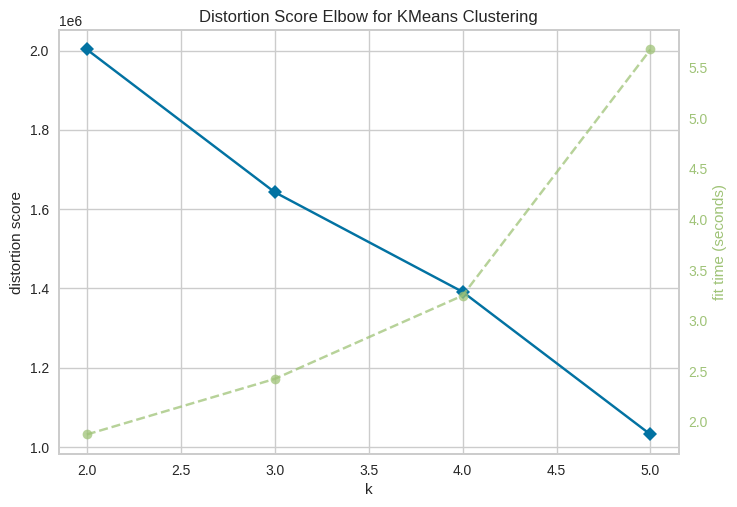

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [259]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

clusters = list(range(2, 6))
ssd = []

for num_clusters in clusters:
    model = KMeans(n_clusters=num_clusters, max_iter=150, random_state=50)
    model.fit(df2_scaled)
    ssd.append(model.inertia_)


visualizer = KElbowVisualizer(KMeans(max_iter=150, random_state=50), k=(2, 6))
visualizer.fit(df2_scaled)
visualizer.show()


In [260]:
clusters

[2, 3, 4, 5]

In [261]:
ssd

[2002599.3463346306, 1642710.2372983932, 1391425.497646229, 1031796.7910174145]

In [262]:
kmean_model = KMeans(n_clusters=3)
kmean_model.fit(df2_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=3)

In [263]:
kmean_model.labels_

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [264]:
df['cluster'] = kmean_model.labels_
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,total_price,date,customer_recency,cluster
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12-01,71,0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12-01,71,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,71,0
...,...,...,...,...,...,...,...,...,...,...,...,...
406824,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20,2011-12-09,-73,1
406825,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-12-09,-73,1
406826,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73,1
406827,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,-73,1


In [265]:
df['cluster'].unique()

array([0, 1, 2], dtype=int32)

In [266]:
fig = px.pie(df, values = df['cluster'].value_counts(),
             names = (df['cluster'].value_counts()).index,
             title = 'Predicted Clusters Distribution')
fig.show()

* Cluster 0 : The first cluster can be interpreted as "Top/Best Customers" who have been shopping in average frequency or most recently, but spent a good amount. The store/department should reward or offer membership or loyalty programs them to become its Loyalists or Champions.

* Cluster 1 : The second cluster belongs to the "Current Custemer" who have been shopping at different frequencies and spending in varying amounts. The store/department should offer membership or loyalty programs or recommend related products to upsell them and help them become its Loyalists or Champions, and offer renewals and helpful products to encourage another purchase.

* Cluster 2 : The first cluster is more related to the "Lost/Needed Attention Customers" who used to visit and shopping at different frequencies or who are still customer but haven’t been visiting recently. The store/department should bring them back with relevant personalized promotions, and run surveys to find out what went wrong and avoid losing them to a competitor.

In [269]:
predict = kmean_model.predict(df2_scaled)

In [270]:
predict

array([1, 1, 1, ..., 0, 0, 0], dtype=int32)